# Description

This notebook is used to create a training and validation dataset. The data is stored on disk and is converted into formats suitable for eith a ViT or CoCA model.

The data is prompt-image pairs and they are organized different on disk depending on their format during either download or creating with Stable Diffiusion 2. This notebook standardizes their format and makes it suitable for fine-tuning models.

Notes:
- Prompts are filtered based on cosine-similarity and similar prompts are excluded based on a cosine-similarity threshold specified by the user.

# Import Modules and Libraries

In [1]:
import unicodedata
import pandas as pd
from tqdm.notebook import tqdm
from pathlib import Path
import gc
import re
from sklearn.model_selection import train_test_split
import sys
import json
from PIL import Image

In [2]:
# Get parent folder for the project locally
BASE_DIR = []
for i in Path.cwd().parts:
    if i != '/':
        BASE_DIR.append(i)
    if i == 'StableDiff':
        break
BASE_DIR = Path('/' + '/'.join(BASE_DIR))

# Add local path to libraries/modules (useful if no internet available)
for path_append in [BASE_DIR,
                    BASE_DIR / 'kaggle/input/sentence-transformers-222/sentence-transformers',
                    ]:
    sys.path.append(str(path_append))

from utils import filt_embeds
from sentence_transformers import SentenceTransformer, util

## User Inputs

In [3]:
# Which datasets to use
DFS_TO_USE = ['3', '5', '16']
DFS_NAMES = '-'.join([f'ds{i}' for i in DFS_TO_USE])

# Which datasets to filter similar embeddings on
FILT_EMBED = {'sd2': False}

# Illustration purposes
DEMO = False

# Similarity Search Parameters
threshold = 0.9  # Set the threshold for similarity.
n_neighbors = 1_000  # Set the number of neighbors to consider.

# Perform batch processing because processing all data at once may cause resource shortage.
batch_size = 5_000  # Set the batch size (i.e., the number of data items to be processed at once).

# maximum SD 2M count saved to disk
SD2M = 2000

# Truncate
TRUN = None

# Data for COCa training
COCA = False

# Train and Val. Filenames
if COCA:
    SAVE_FILENAME = f'{DFS_NAMES}-{SD2M}_Train_TRUN{TRUN}_filts_COCA.csv'
    VAL_SAVE_FILENAME = f'val_data_COCA.csv'
else:
    
    SAVE_FILENAME = (f'{DFS_NAMES}-{SD2M}'
                     f'_Train_TRUN{TRUN}_cos_sim_{FILT_EMBED["sd2"]}{str(threshold).split(".")[-1]}.csv')
    VAL_SAVE_FILENAME = f'val_data.csv'
    VAL_SAVE_FILENAME2 = f'val_data_2.csv'

# Paths to meta data CSV
base_dir = Path('/nvme4tb/StableDiffusion')

# 30K images from SD2 [from ayuraj]
ds1 = base_dir / 'dataset1/sd-2-0-download-dataset-from-w-b-artifacts'

# ~80K images from SD2
ds2 = base_dir / 'dataset2/gustavosta-stable-diffusion-prompts-sd2-v2'

# SD2M
ds3 = base_dir / 'dataset3/diffusiondb-metadata'

# COCO
ds4 = base_dir / 'dataset4/coco'
DF4_KEEP_FIRST_LAST = False

# Fine-Tuned GPT2
# https://www.kaggle.com/datasets/xiaozhouwang/sd2gpt2
ds5 = base_dir / 'dataset5'

# Hard coded prompts
# https://www.kaggle.com/datasets/xiaozhouwang/sd2hardcode
ds6 = base_dir / 'dataset6'

# Sbucaptions ()
ds7= base_dir / 'dataset7'

# Laion2B-en-aesthetic
ds8 = base_dir / 'dataset8/laion2B-en-aesthetic'

# Dataset9 - Dunlap Created SD2 Images Using Random Prompts
ds9 = base_dir / 'dataset9/20K-up'

# Midjourney
ds10 = base_dir / 'dataset10'

# 900K Kaggle
# https://www.kaggle.com/datasets/tanreinama/900k-diffusion-prompts-dataset
ds11 = base_dir / 'dataset11/data'

# ChatGPT Kaggle (25K)
# https://www.kaggle.com/datasets/jeinsong/chatgpt-images-w-prompts
# https://www.kaggle.com/competitions/stable-diffusion-image-to-prompts/discussion/402146
ds12 = base_dir / 'dataset12/data'

# Dataset13 - SD2 Images Using Sbucaptions + SD2 prompts
ds13 = base_dir / 'dataset13'

# Dataset13 - 32K nltk syns. images created with SD2
ds15 = base_dir / 'dataset15'

# Dataset16 - Hard-code prompts + GPT2 images created with SD2
ds16 = base_dir / 'dataset16'

print(f'Save FileName: {SAVE_FILENAME}')

Save FileName: ds3-ds5-ds16-2000_Train_TRUNNone_cos_sim_False9.csv


## Functions

In [4]:
def is_english_only(string):
    for s in string:
        cat = unicodedata.category(s)         
        if not cat in ['Ll', 'Lu', 'Nd', 'Po', 'Pd', 'Zs']:
            return False
    return True

def check_string(string: str) -> bool:
    # Checks if the given string contains any character other than alphanumeric characters, comma, dot, hyphen or whitespace
    return bool(re.search(r'[^A-Za-z0-9,.\\-\\s]', string))

## Load Data

(30029, 3)
Inca riding a motorcycle


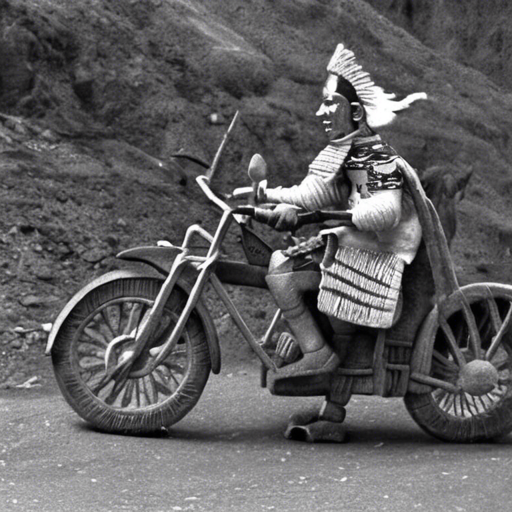

In [5]:
# Open CSV files for dataset1
files = ds1.glob('*csv')
for idx, file in enumerate(list(files)):
    tmp = pd.read_csv(file)
    tmp['image_path'] = str(ds1) + '/artifacts' + tmp['image_path'].str.split('artifacts').str[-1]
    if idx == 0:
        df1 = tmp
    else:
        df1 = pd.concat([df1, tmp])
del tmp
df1['dataset_id'] = 1
print(df1.shape)

random_row = df1.sample(1).iloc[0]
print(random_row.prompt)
im = Image.open(random_row.image_path)
display(im)

(81910, 3)
kyoto animation, cool african lady wearing cyberpunk intricate warcore, neon lighting tubes, beautiful, detailed portrait, cell shaded, 4 k, concept art, by wlop, ilya kuvshinov, artgerm, krenz cushart, greg rutkowski, pixiv. cinematic dramatic atmosphere, sharp focus, volumetric lighting, cinematic lighting, studio quality


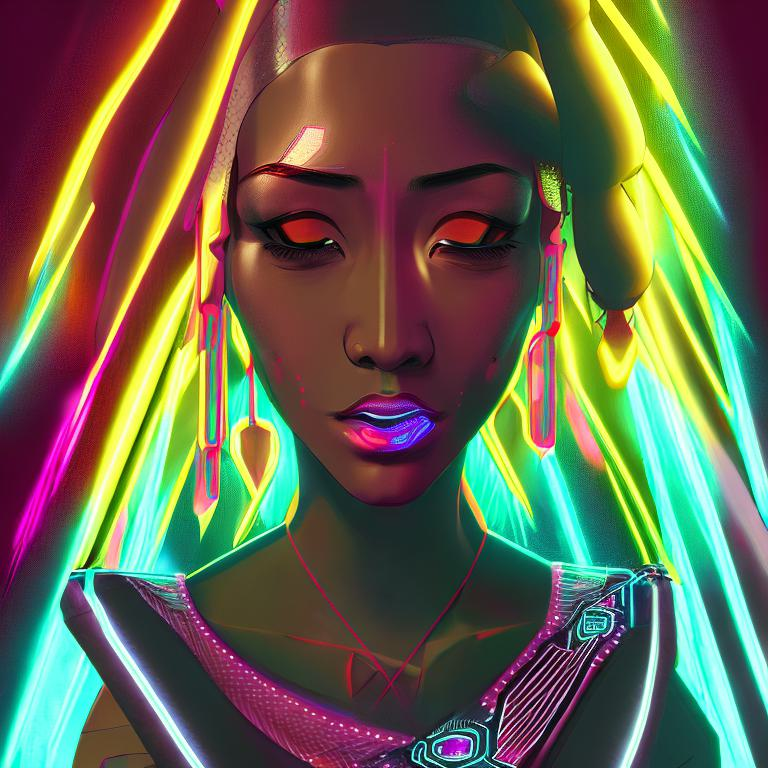

In [6]:
# Open CSV files for dataset2
df2 = pd.concat([pd.read_csv(ds2 / 'train.csv'),
                 pd.read_csv(ds2 / 'eval.csv')])
df2.rename(columns={'Prompt': 'prompt'}, inplace=True)
split_on = 'kaggle/input/gustavosta-stable-diffusion-prompts-sd2-v2'
df2['image_path'] = str(ds2) + df2['image_path'].str.split(split_on).str[-1]
df2['dataset_id'] = 2

print(df2.shape)

random_row = df2.sample(1).iloc[0]
print(random_row.prompt)
im = Image.open(random_row.image_path)
display(im)

(2000000, 3)
a WLOP 3d render of Very very very very highly detailed beautiful mystic portrait of a phantom undead ape with whirling galaxy around, tattoos by Anton Pieck, intricate,  extremely detailed, digital painting, artstation, concept art, smooth, sharp focus, illustration, intimidating lighting, incredible art,


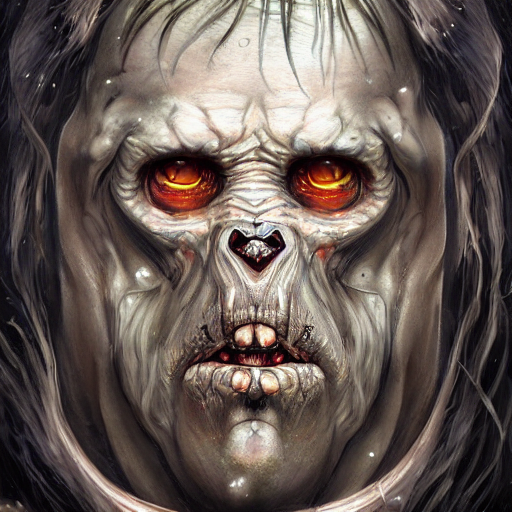

In [7]:
# Open dataset3 csv
df3 = pd.read_parquet(ds3 / 'metadata.parquet')

# Only keep up to SD-2M saved to disk
df3 = df3[df3.part_id <= SD2M].reset_index(drop=True)


# Create image path
def roundup(x):
    return x if x % 100 == 0 else x + 100 - x % 100


def folder_name(i):
    x = roundup(i)
    name = f'diffusiondb-2m-part-{str(x-99).zfill(4)}-to-{str(x).zfill(4)}-of-2000'
    return name


df3['folder_name'] = df3['part_id'].apply(folder_name)
df3['image_path'] = str(ds3.parents[0]) + '/' + df3['folder_name'] + '/' + df3['image_name']
df3['dataset_id'] = 3
df3 = df3[['prompt', 'image_path', 'dataset_id']]
print(df3.shape)

random_row = df3.sample(1).iloc[0]
print(random_row.prompt)
im = Image.open(random_row.image_path)
display(im)

len(df4): 123,287
There are two little yellow birds in the tree.


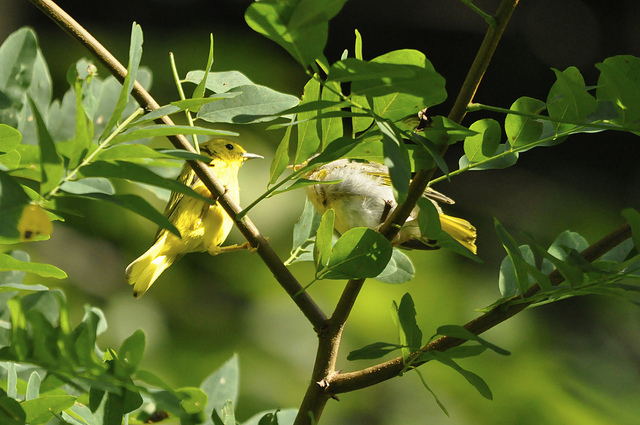

In [8]:
# Dataset4 COCO
# https://www.kaggle.com/code/pritishmishra/image-captioning-on-coco-dataset
df4 = None
for name in ['train', 'val']:
    with open(ds4 / f'annotations/captions_{name}2017.json', 'r') as f:
        val4 = json.load(f)
        val4 = val4['annotations']
        
    img_cap_pairs = []
    for sample in val4:
        img_name = '%012d.jpg' % sample['image_id']
        img_cap_pairs.append([img_name, sample['caption']])

    captions = pd.DataFrame(img_cap_pairs, columns=['image_path', 'prompt'])

    captions['image_path'] = captions['image_path'].apply(
        lambda x: f'{str(ds4)}/images/{name}2017/{x}'
    )
    if df4 is None:
        df4 = captions
    else:
        df4 = pd.concat([df4, captions])
    del captions

# Drop duplicate prompts
if DF4_KEEP_FIRST_LAST:
    df4 = pd.concat([df4.drop_duplicates(subset='image_path', keep='first'),
                     df4.drop_duplicates(subset='image_path', keep='last')])
else:
    df4 = df4.drop_duplicates(subset='image_path', keep='first')
df4 = df4.reset_index(drop=True)
df4['dataset_id'] = 4
print(f'len(df4): {len(df4):,}')

random_row = df4.sample(1).iloc[0]
print(random_row.prompt)
im = Image.open(random_row.image_path)
display(im)

len(df5): 30,318
still of the pope playing piano in a


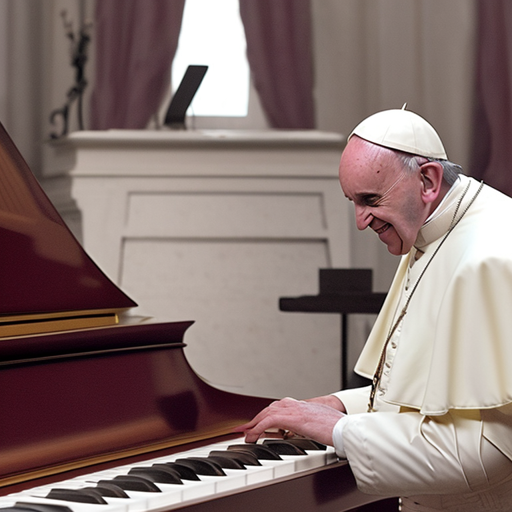

In [9]:
# Dataset5
df5 = pd.read_csv(ds5 / 'gpt_generated_prompts.csv')
df5['image_path'] = df5.index.map(str) + '.png'
df5['image_path'] = (df5['image_path']
                     .apply(lambda x: f'{str(ds5)}/gpt_generated_images/gpt_generated_images/{x}'))
df5['dataset_id'] = 5
print(f'len(df5): {len(df5):,}')

random_row = df5.sample(1).iloc[0]
print(random_row.prompt)
im = Image.open(random_row.image_path)
im

len(df6): 42,356
Exotic savanna, racing, yellow, peter mohrbacher


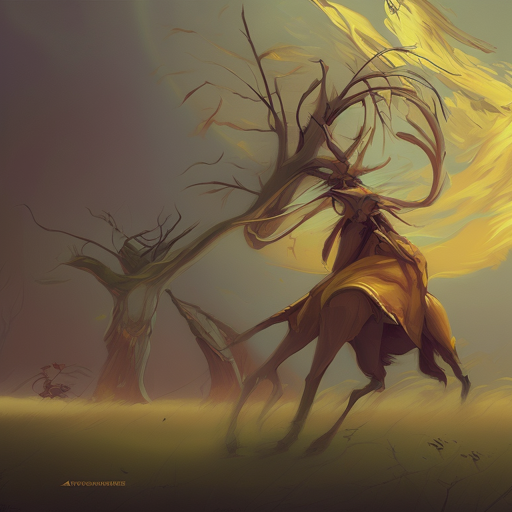

In [10]:
# Dataset6
df6 = pd.read_csv(ds6 / 'hardcoded_prompts.csv')
df6['image_path'] = df6.index.map(str) + '.png'
df6['image_path'] = (df6['image_path']
                     .apply(lambda x: f'{str(ds6)}/hardcoded_images/hardcoded_images/{x}'))
df6['dataset_id'] = 6
print(f'len(df6): {len(df6):,}')

random_row = df6.sample(1).iloc[0]
print(random_row.prompt)
im = Image.open(random_row.image_path)
im

Original len: 2,788,195
After Drop duplicates len: 2,631,114
After Min. Image Size 384: 1,194,397
Final Len: 875,757
"""The Gathering""- a winter art print featuring a pair of cardinals sitting on snow laden pine boughs watching a horse and sleigh in front of a big contemporary home by American Country Artist Patricia Hobson."


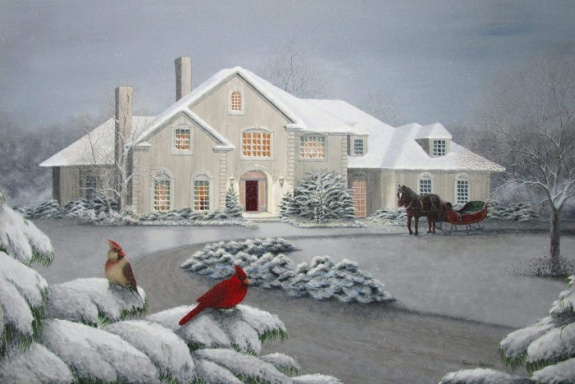

In [11]:
# Dataset8 Laion-2B

# Minimum img size
min_img_size = 384

# Load data
data = [pd.read_parquet(i) for i in ds8.glob('*.parquet')]
df8 = pd.concat(data, axis=0)
df8 = df8[df8.status == 'success'].reset_index(drop=True)
df8['image_path'] = df8['key'].apply(lambda x: f'{str(ds8)}/data/{x}.jpg')
df8.rename(columns={'caption': 'prompt'}, inplace=True)
print(f'Original len: {len(df8):,}')

# add dataset id
df8['dataset_id'] = 8

# drop duplicate prompts
df8 = df8.drop_duplicates(subset="prompt")
print(f'After Drop duplicates len: {len(df8):,}')

# Only select images large enough
df8 = df8[(df8['width']>=min_img_size) & (df8['height']>=min_img_size)].reset_index(drop=True)
print(f'After Min. Image Size {min_img_size}: {len(df8):,}')

# Filter further
TRUN_DF8 = 10
df8['prompt'] = df8['prompt'].str.strip()
df8['prompt'] = df8['prompt'].astype(str)
df8 = df8[df8['prompt'].map(lambda x: len(x.split())) >= 5]
df8 = df8[df8['prompt'].apply(is_english_only)]
df8 = df8[~df8['prompt'].str.contains('^(?:\s*|NULL|null|NaN)$', na=True)]
df8.reset_index(drop=True, inplace=True)

# Keep only relevant columns for processing
df8 = df8[['image_path', 'prompt', 'dataset_id']]
print(f'Final Len: {len(df8):,}')
del data

random_row = df8.sample(1).iloc[0]
print(random_row.prompt)
im = Image.open(random_row.image_path)
display(im)

(75000, 3)
hurried swan hops rock album cover, highly detailed photo. intricate detail and brush strokes oil painting in the style of caravaggio by michael whelan james gurney artstation hq 8 k 4 0 2 3 1 6 7 9 d cgsociety rendered with octane render unreal engine volumetric lighting subsurface scattering shiny skin texture ambient occlusion shadow



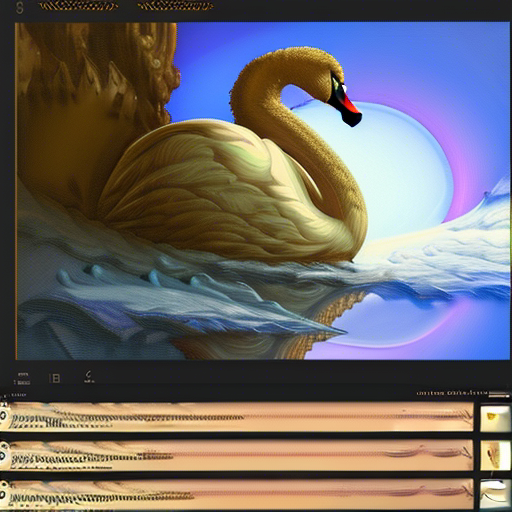

In [12]:
# Dataset9 - Dunlap Created SD2 Images Using Random Prompts
df9 = None
for folder_name in ds9.glob('*'):
    start = int(folder_name.stem.split('_')[0])
    file_path = folder_name / f'{folder_name.stem}.txt'
    with open(file_path) as f:
        lines = f.readlines()
    f.close()
    # Image count
    idxs = [start + i for i in range(len(lines))]
    
    # Image path
    image_path = [folder_name / f'samples/{i:05d}.png' for i in range(len(lines))]
    
    tmp = pd.DataFrame.from_dict({'image_path': image_path,
                                  'prompt': lines})
    if df9 is None:
        df9 = tmp
    else:
        df9 = pd.concat([df9, tmp], axis=0)

# Dataset ID
df9['dataset_id'] = 9
print(df9.shape)

random_row = df9.sample(1).iloc[0]
print(random_row.prompt)
im = Image.open(random_row.image_path)
display(im)

df10.len: 59,179
playboi carti with lime green cowboy hat and diamond teeth, illustration by edward kinsella 50


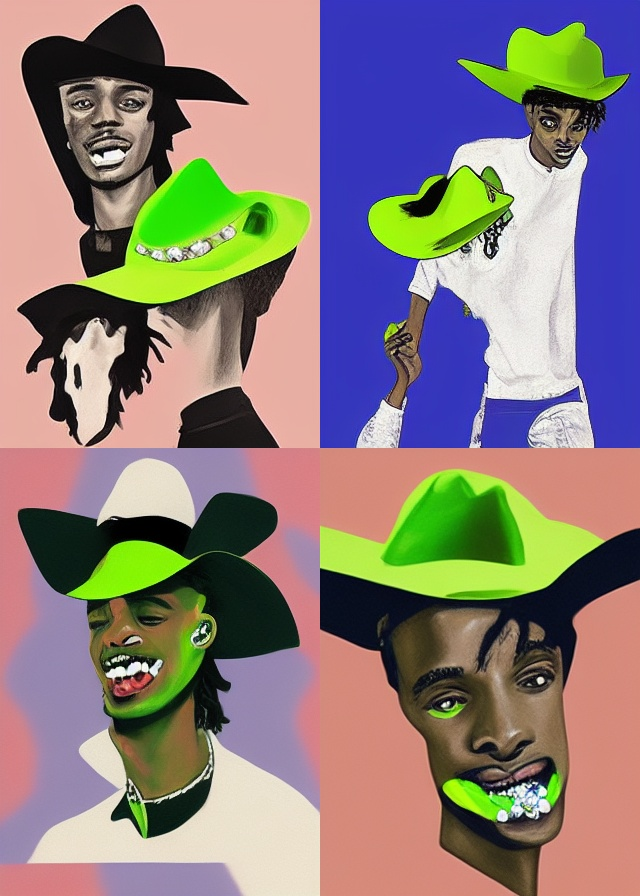

In [13]:
# Dataset10 - Midjourney
mj = pd.read_csv(ds10 / 'midjourney.csv')
mj = mj.rename(columns={'Generated Image URL': 'url'})
ds10_images = ds10 / 'images'
data = []
for path_name in ds10_images.glob('*.parquet'):
    folder_name = str(path_name).split('/')[-1].split('.parquet')[0]
    tmp = pd.read_parquet(path_name)
    tmp['folder'] = folder_name
    data.append(tmp)

df10 = pd.concat(data, axis=0)
df10 = df10[df10['status'] == 'success'].reset_index(drop=True)

df10['image_path'] = df10.apply(lambda x: f'{str(ds10)}/images/{x["folder"]}/{x["key"]}.jpg', axis=1)
df10.rename(columns={'caption': 'prompt'}, inplace=True)

# Merge list with df10
df10 = df10.merge(mj, on='url')

# Dataset ID
df10['dataset_id'] = 10

# Rename columns
df10 = df10.rename(columns={'no_url': 'prompt'})
df10 = df10[['image_path', 'prompt', 'dataset_id']]
print(f'df10.len: {len(df10):,}')

random_row = df10.sample(1).iloc[0]
print(random_row.prompt)
im = Image.open(random_row.image_path)
display(im)

df11.len: 611,563
ultra detailed of flowing ivory, covered with billowing smoke, light rays, headshot, close up, light streaks, extremely detailed, ultra realistic, intricate details, high definition, mist, fog, bones, rim light


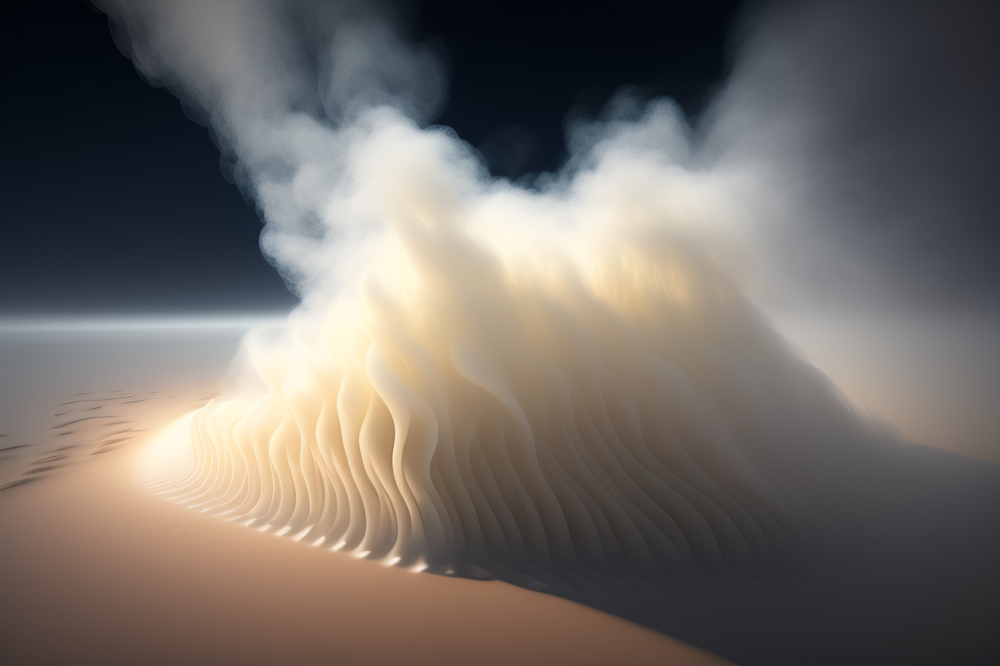

In [14]:
# Dataset 11 - 900K Kaggle
df11_info = pd.read_csv(ds11 / 'diffusion_prompts.csv')

ds11_images = ds11 / 'images'
data = []
for path_name in ds11_images.glob('*.parquet'):
    folder_name = str(path_name).split('/')[-1].split('.parquet')[0]
    tmp = pd.read_parquet(path_name)
    tmp['folder'] = folder_name
    data.append(tmp)

df11 = pd.concat(data, axis=0)
df11 = df11[df11['status'] == 'success'].reset_index(drop=True)

df11['image_path'] = df11.apply(lambda x: f'{str(ds11)}/images/{x["folder"]}/{x["key"]}.jpg', axis=1)
df11.rename(columns={'caption': 'prompt'}, inplace=True)

# Merge list with df11
df11 = df11.merge(df11_info, on='url')

# Dataset ID
df11['dataset_id'] = 11

# Rename columns
df11 = df11.rename(columns={'no_url': 'prompt'})
df11 = df11[['image_path', 'prompt', 'dataset_id']]
df11 = df11.dropna(subset='prompt')
df11['prompt'] = df11['prompt'].str.strip()
df11['prompt'] = df11['prompt'].astype(str)
df11 = df11[df11['prompt'].map(lambda x: len(x.split())) >= 5]
df11 = df11[df11['prompt'].apply(is_english_only)]
df11 = df11[~df11['prompt'].str.contains('^(?:\s*|NULL|null|NaN)$', na=True)]
df11.reset_index(drop=True, inplace=True)
print(f'df11.len: {len(df11):,}')

random_row = df11.sample(1).iloc[0]
print(random_row.prompt)
im = Image.open(random_row.image_path)
display(im)

(25696, 3)
A majestic steampunk airship flying over a vast desert, with a crew of eccentric inventors and a loyal pack of sky wolves


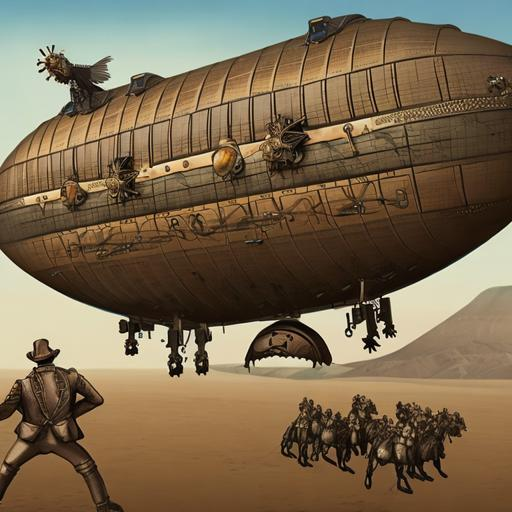

In [15]:
# ChatGPT Kaggle (~25K)
# https://www.kaggle.com/datasets/jeinsong/chatgpt-images-w-prompts
# https://www.kaggle.com/competitions/stable-diffusion-image-to-prompts/discussion/402146
df12 = pd.read_json(ds12 / 'metadata.jsonl', lines=True)
df12['image_path'] = df12['file_name'].apply(lambda x: f'{str(ds12)}/chatgpt-images/{x}')
df12.rename(columns={'orig_text': 'prompt'}, inplace=True)

# Dataset ID
df12['dataset_id'] = 12

# Keep relevant columns
df12 = df12[['image_path', 'prompt', 'dataset_id']]
print(df12.shape)

random_row = df12.sample(1).iloc[0]
print(random_row.prompt)
im = Image.open(random_row.image_path)
display(im)

(95089, 3)
Old balcony in a Cuzco street, 4k photography by Mario Testino and Paul Lehr. Cinematic lighting with bokeh lights on at dusk sunset clouds visible through the fog shot from above award winning camera lens flare filter unreal engine oct



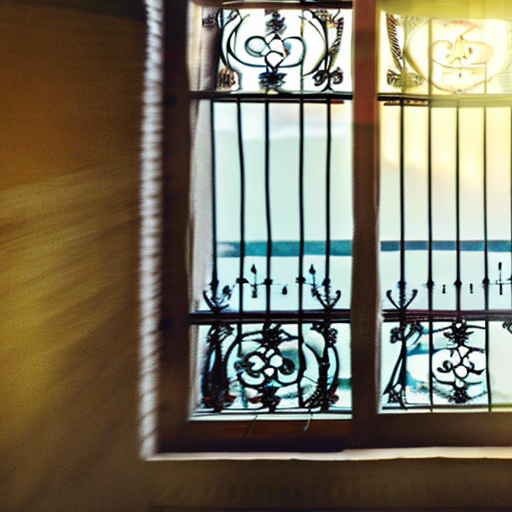

In [16]:
# Dataset13 - Dunlap Created SD2 Images Using SBUcaptions + Prompts
df13 = None
for folder_name in ds13.glob('*'):
    start = int(folder_name.stem.split('_')[0])
    file_path = folder_name / f'{folder_name.stem}.txt'
    with open(file_path) as f:
        lines = f.readlines()
    f.close()
    # Image count
    idxs = [start + i for i in range(len(lines))]
    
    # Image path
    image_path = [folder_name / f'samples/{i:05d}.png' for i in range(len(lines))]
    
    tmp = pd.DataFrame.from_dict({'image_path': image_path,
                                  'prompt': lines})
    if df13 is None:
        df13 = tmp
    else:
        df13 = pd.concat([df13, tmp], axis=0)

df13['file_exist'] = df13['image_path'].apply(lambda x: x.is_file())
df13 = df13[df13['file_exist'] == True].reset_index(drop=True)

# Dataset ID
df13['dataset_id'] = 13
df13 = df13[['image_path', 'prompt', 'dataset_id']]
print(df13.shape)

random_row = df13.sample(1).iloc[0]
print(random_row.prompt)
im = Image.open(random_row.image_path)
display(im)

(32923, 3)
mucous tissue of or secreting or covered with or resembling mucus, erythrocytes, cerebrospinal fluid, granulomas,



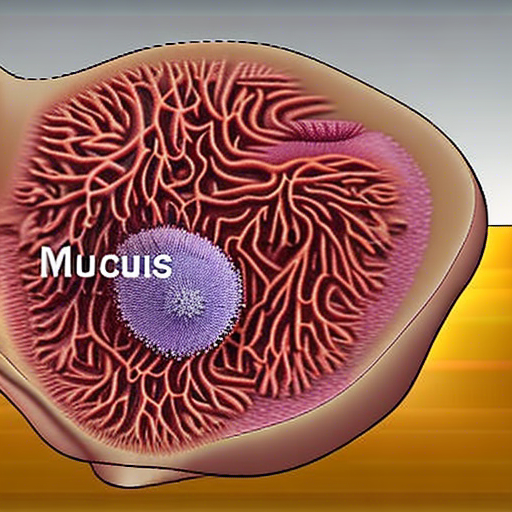

In [17]:
# Dataset15 - Dunlap Created SD2 Images Using Random Prompts
df15 = None
for folder_name in ds15.glob('*'):
    start = int(folder_name.stem.split('_')[0])
    file_path = folder_name / f'{folder_name.stem}.txt'
    with open(file_path) as f:
        lines = f.readlines()
    f.close()
    # Image count
    idxs = [start + i for i in range(len(lines))]
    
    # Image path
    image_path = [folder_name / f'samples/{i:05d}.png' for i in range(len(lines))]
    
    tmp = pd.DataFrame.from_dict({'image_path': image_path,
                                  'prompt': lines})
    if df15 is None:
        df15 = tmp
    else:
        df15 = pd.concat([df15, tmp], axis=0)

# Dataset ID
df15['dataset_id'] = 15
print(df15.shape)

random_row = df15.sample(1).iloc[0]
print(random_row.prompt)
im = Image.open(random_row.image_path)
display(im)

(32654, 3)
cute viking with a large flower near a western desert!!!, trending on artstation by wlop octane render blender 8 k isometric!!!!!! low poly 3 d pixar dis



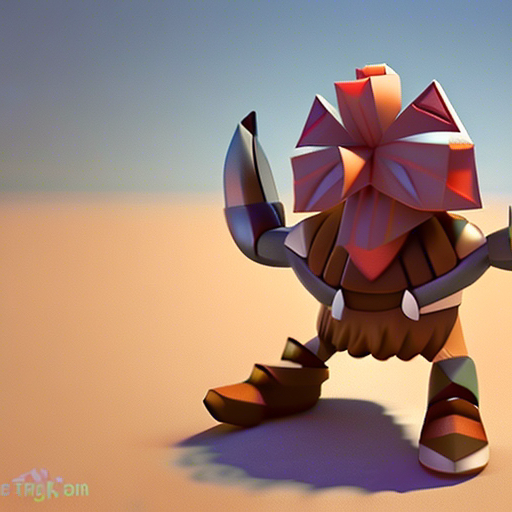

In [18]:
# Dataset16 - Dunlap Created SD2 Images Using Random Prompts
df16 = None
for folder_name in ds16.glob('*'):
    start = int(folder_name.stem.split('_')[0])
    file_path = folder_name / f'{folder_name.stem}.txt'
    with open(file_path) as f:
        lines = f.readlines()
    f.close()
    # Image count
    idxs = [start + i for i in range(len(lines))]
    
    # Image path
    image_path = [folder_name / f'samples/{i:05d}.png' for i in range(len(lines))]
    
    tmp = pd.DataFrame.from_dict({'image_path': image_path,
                                  'prompt': lines})
    if df16 is None:
        df16 = tmp
    else:
        df16 = pd.concat([df16, tmp], axis=0)

# Dataset ID
df16['dataset_id'] = 16
print(df16.shape)

random_row = df16.sample(1).iloc[0]
print(random_row.prompt)
im = Image.open(random_row.image_path)
display(im)

# Combine All Other Datasets

- Early models were built using datasets: 2, 3, 5, 6, & 8
- Later models can be built using datasets: 9, 10, 11, 12

In [19]:
# COMBINE ANY FUTURE DATASETS TO DF HERE
df_final = None
for df_to_use in DFS_TO_USE:
    # if df_to_use == '':
    #     tmp = df
    if df_to_use == '2':
        tmp = df2
    elif df_to_use == '3':
        tmp = df3
    elif df_to_use == '4':
        tmp = df4
    elif df_to_use == '5':
        tmp = df5
    elif df_to_use == '6':
        tmp = df6
    elif df_to_use == '8':
        tmp = df8
    elif df_to_use == '9':
        tmp = df9
    elif df_to_use == '10':
        tmp = df10
    elif df_to_use == '11':
        tmp = df11
    elif df_to_use == '12':
        tmp = df12
    elif df_to_use == '13':
        tmp = df13
    elif df_to_use == '15':
        tmp = df15
    elif df_to_use == '16':
        tmp = df16
    else:
        print('WRONG FIX ME!!!')
    print(f'df{df_to_use}.shape: {tmp.shape}')
    if df_final is None:
        df_final = tmp
    else:
        df_final = pd.concat([df_final, tmp])
df_final.shape

df = df_final
df = df.reset_index(drop=True)
del df_final

df = df.sample(frac=1.0, random_state=42)
df.reset_index(drop=True, inplace=True)
print(f'df shape: {df.shape}')
print(f'Datasets Used: {sorted(df.dataset_id.unique())}')
display(df['dataset_id'].value_counts().sort_index())

df3.shape: (2000000, 3)
df5.shape: (30318, 3)
df16.shape: (32654, 3)
df shape: (2062972, 3)
Datasets Used: [3, 5, 16]


3     2000000
5       30318
16      32654
Name: dataset_id, dtype: int64

## Filter Data Based on Criteria

In [20]:

display(df['dataset_id'].value_counts().sort_index())
print(f'df shape: {df.shape}')
df['image_path'] = df['image_path'].astype(str)
df['prompt'] = df['prompt'].str.strip()
df['prompt'] = df['prompt'].astype(str)
df = df[df['prompt'].map(lambda x: len(x.split())) >= 5]
df = df[~df['prompt'].str.contains('^(?:\s*|NULL|null|NaN)$', na=True)]
df = df[df['prompt'].apply(is_english_only)]


# Drop similar prompt embeddings
if FILT_EMBED['sd2']:
    # Only keep SD2M data 

    df = filt_embeds.filt_similar_embeddings(df=df,
                                               threshold=threshold,
                                               demo=DEMO,
                                               n_neighbors=n_neighbors,
                                               batch_size=batch_size)
    df = df.reset_index(drop=True)

3     2000000
5       30318
16      32654
Name: dataset_id, dtype: int64

df shape: (2062972, 3)


In [21]:
# df = df.iloc[cs_idxs]
df.reset_index(drop=True, inplace=True)
df = df[['prompt', 'image_path', 'dataset_id']].reset_index(drop=True)
display(df['dataset_id'].value_counts().sort_index())
print(df.shape)
display(df.tail())

3     1787206
5       28355
16      27598
Name: dataset_id, dtype: int64

(1843159, 3)


,prompt,image_path,dataset_id
1843154,a portrait of an elven paladin in a flowing re...,/nvme4tb/StableDiffusion/dataset3/diffusiondb-...,3
1843155,detailed intricate digital illustration by gre...,/nvme4tb/StableDiffusion/dataset3/diffusiondb-...,3
1843156,"barack obama in the style of gta san andreas, ...",/nvme4tb/StableDiffusion/dataset3/diffusiondb-...,3
1843157,futuristic caves camouflaged and sculpted in t...,/nvme4tb/StableDiffusion/dataset3/diffusiondb-...,3
1843158,Purple hair relistic Portrait of a two woman w...,/nvme4tb/StableDiffusion/dataset3/diffusiondb-...,3


# Validation Dataset

In [22]:
# Create a 2nd validation dataset
# Concatenate df2 and df3 b/c cleanest datasets
train, val = train_test_split(df, test_size=0.05, random_state=42, shuffle=True)

# Load encoder model
st_model = SentenceTransformer('../kaggle/input/sentence-transformers-222/all-MiniLM-L6-v2',
                               device='cuda',
                               )

# Get prompt embeddings
val_prompts = val['prompt'].values
val_prompt_embeddings = st_model.encode(val_prompts,
                                    show_progress_bar=True,
                                    convert_to_tensor=True,
                                    )

# Get embeddings in another dataframe
val_prompt_embed_numpy = val_prompt_embeddings.detach().cpu().numpy()
embed_cols = [f'embed_{i + 1}' for i in range(val_prompt_embed_numpy.shape[1])]
val_embed = pd.DataFrame(val_prompt_embed_numpy, columns=embed_cols)

# Put embeddings with val
val = val.reset_index(drop=True)
val = pd.concat([val, val_embed], axis=1)

# Save validation dataset to disk
if COCA:
    val = val[['image_path', 'prompt']]
    val.rename(columns={'image_path': 'filepath', 'prompt': 'title'},
               inplace=True)
    val.to_csv(f'../kaggle/{VAL_SAVE_FILENAME2}', index=False, sep='\t')
else:
    val.to_csv(f'../kaggle/{VAL_SAVE_FILENAME2}', index=False)
print(f'Val. Shape: {val.shape}')
print(f'../kaggle/{VAL_SAVE_FILENAME2}')
# print(val['dataset_id'].value_counts().sort_index())
# To prevent data leakage train will become df
del val, df, val_prompts, val_prompt_embeddings, val_embed
gc.collect()

Batches:   0%|          | 0/2880 [00:00<?, ?it/s]

Val. Shape: (92158, 387)
../kaggle/val_data_2.csv


18

In [23]:
# Create new df without leakage of val into train
df = train.reset_index(drop=True)
df['image_path'] = df['image_path'].astype(str)
print(f'df shape: {df.shape}')
display(df['dataset_id'].value_counts().sort_index())

df shape: (1751001, 3)


3     1697921
5       26911
16      26169
Name: dataset_id, dtype: int64

## Prompts Embeddings

In [24]:
# Load encoder model
st_model = SentenceTransformer('../kaggle/input/sentence-transformers-222/all-MiniLM-L6-v2',
                               device='cuda',
                               )

# Get prompt embeddings
prompts = df['prompt'].values
prompt_embeddings = st_model.encode(prompts,
                                    show_progress_bar=True,
                                    convert_to_tensor=True,
                                    )

# Get embeddings in another dataframe
prompt_embed_numpy = prompt_embeddings.detach().cpu().numpy()
embed_cols = [f'embed_{i + 1}' for i in range(prompt_embed_numpy.shape[1])]
embed = pd.DataFrame(prompt_embed_numpy, columns=embed_cols)

# Put embeddings with df
df = pd.concat([df, embed], axis=1)


Batches:   0%|          | 0/54719 [00:00<?, ?it/s]

## Example Image/Prompts

Dataset ID 3:
dark brandon, a dark anti hero version of jon biden standing as a powerful leader in from of the rubble of mara lago


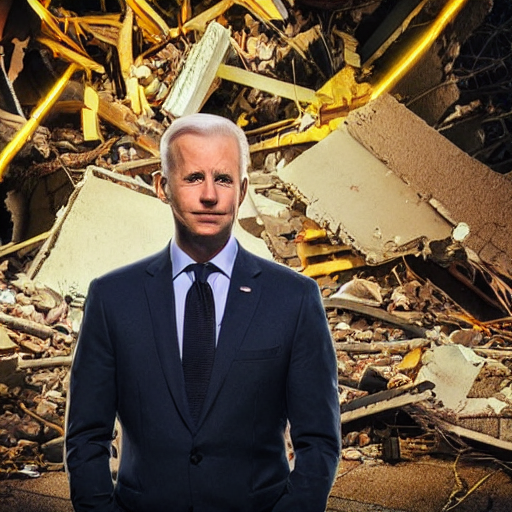

Dataset ID 3:
kodak portra 4 0 0, extreme fisheye, wetplate, muted colours, no people, 1 9 3 0 s award winning colour portrait of a beautiful landscape, farm barns, red dead redemption 2, by saul leiter, sunny weather, insanely detailed, insanely intricate, depth of field, motion blur, blueberry teal creme orange colours, no people


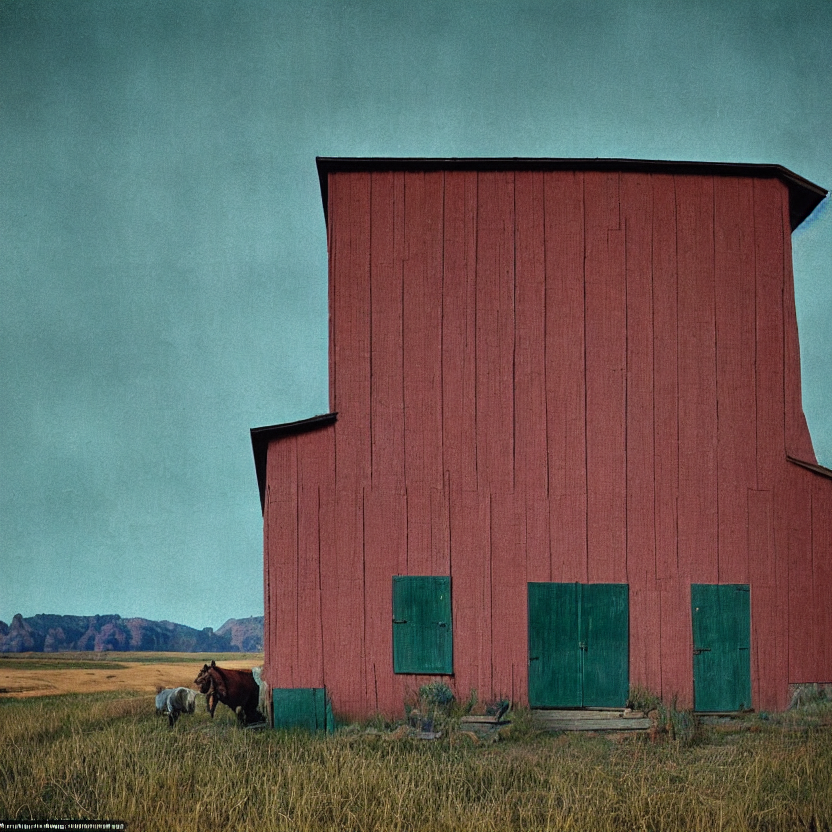

Dataset ID 3:
a portrait of a robotic rooster wearing a hoodie, artstation, illustration


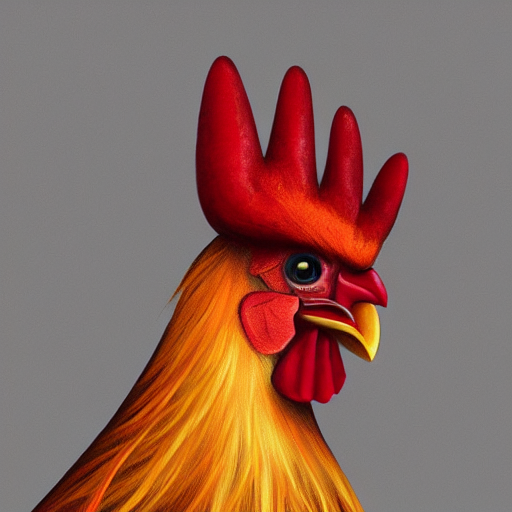

Dataset ID 3:
corn 2, the conservative sequel to corn. the only patriotic protein powder. made with 5 0 % more plastic. obama doesn't want you to have this.


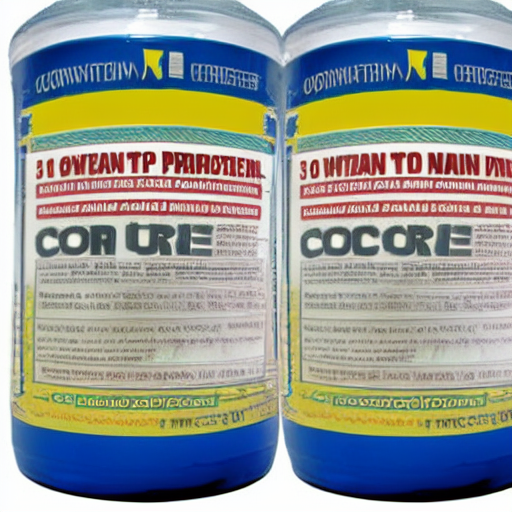

Dataset ID 3:
interier view of award - winning pirate themed escape room set on the top deck on pirate ship from 1 7 2 0. steampunk. trending on artstation, realistic.


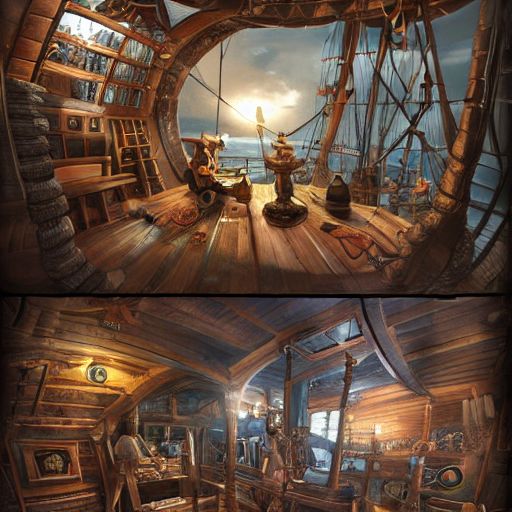

Dataset ID 3:
dwayne johnson old martial arts master, naruto style, anime digital art style, trending on artstation


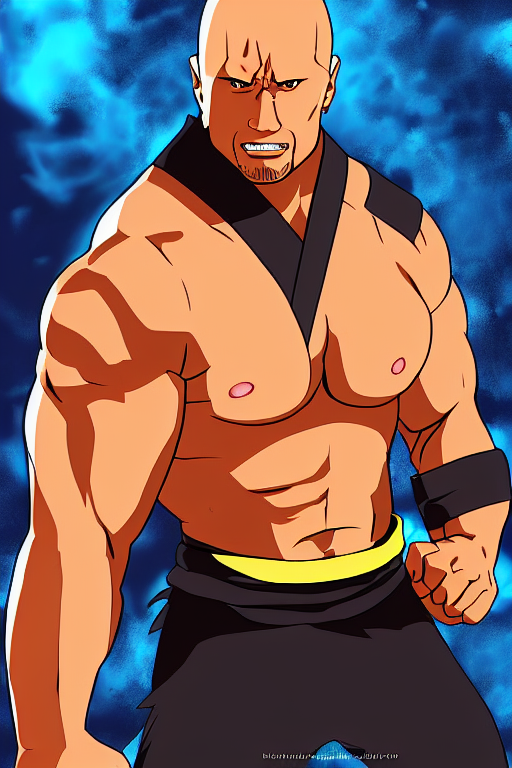

Dataset ID 3:
dynamic composition, a painting of a woman with green eyes and hair made of peacock plummage, a surrealist painting by Tom Bagshaw and Jacek Yerga and Tamara de Lempicka, featured on cgsociety, pop surrealism, surrealist, wiccan, pre-raphaelite, ornate gilded details


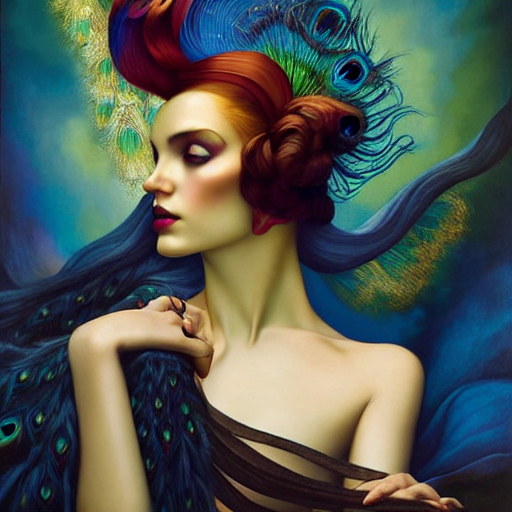

Dataset ID 3:
cute anthropomorphic, fantasy, intricate, elegant, highly detailed, digital painting, artstation, concept art, wallpaper, smooth, sharp focus, illustration, art by artgerm and greg rutkowski and alphonse mucha


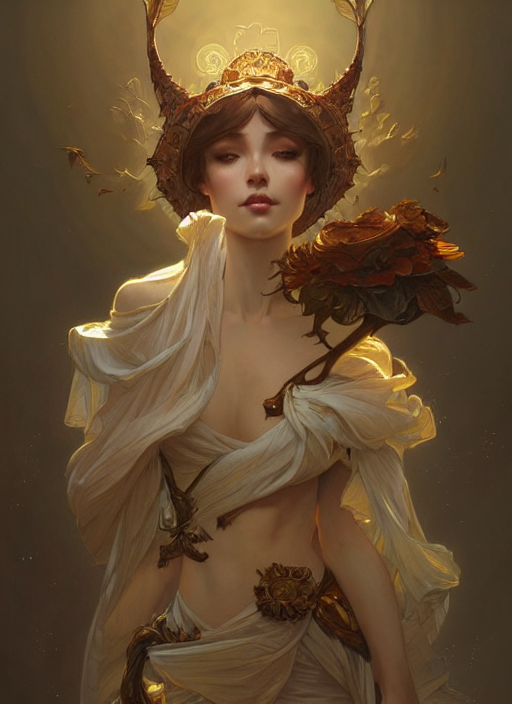

Dataset ID 3:
Ultra realistic, great military mechs, cyberpunk, sci-fi, fantasy, intricate, elegant, highly detailed, digital painting, artstation, concept art, smooth, sharp focus, illustration, art by artgerm and greg rutkowski and alphonse mucha


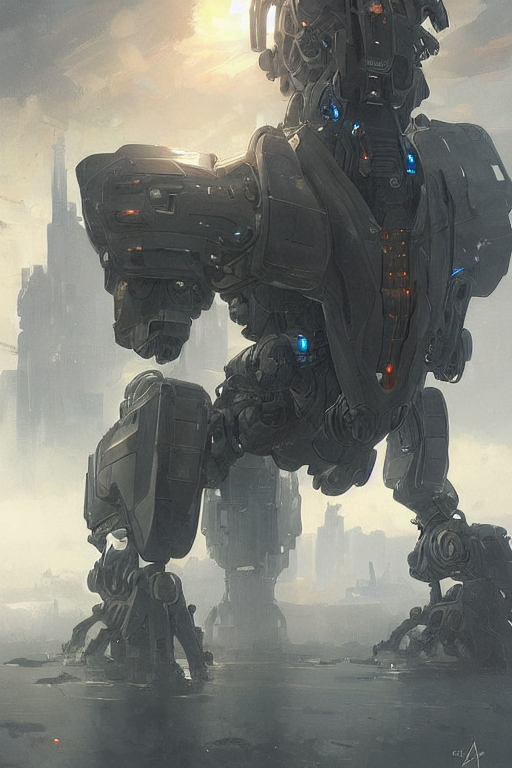

Dataset ID 3:
illustration of barcelona cityscape at water by jean giraud & kilian eng


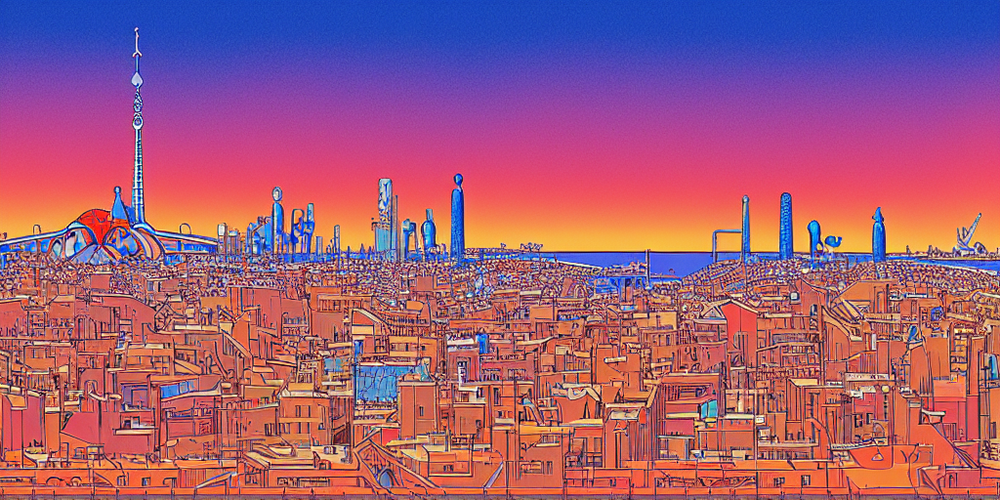

In [26]:
for _ in range(0, 10):
    random_row = df.sample(1).iloc[0]
    print(f'Dataset ID {random_row.dataset_id}:\n{random_row.prompt}')
    im = Image.open(random_row.image_path)
    display(im)

## Save Training Dataset to Disk

In [ ]:
if COCA:
    df = df[['image_path', 'prompt']]
    df.rename(columns={'image_path': 'filepath', 'prompt': 'title'},
              inplace=True)
    df.to_csv(f'../kaggle/{SAVE_FILENAME}', index=False, sep='\t')
else:
    df['prompt'] = df['prompt'].str.replace('\n', '')
    df.to_csv(f'../kaggle/{SAVE_FILENAME}', index=False,
              escapechar='"')
print(SAVE_FILENAME)
print(f'df shape: {df.shape}')
print(f'Datasets Used: {sorted(df.dataset_id.unique())}')
display(df['dataset_id'].value_counts().sort_index())